In [4]:
!nvidia-smi
!lscpu

Thu Jun 20 04:42:03 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Importing the required packages

Now, we are going to import the packages that we require to make our code work.



In [6]:
import tensorflow as tf
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
import random
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import math
import ipyplot
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.losses import *
from sklearn.metrics import f1_score
import tensorflow_addons as tfa


        WARNING! Google Colab Environment detected!
        You might encounter issues while running in Google Colab environment.
        If images are not displaying properly please try setting `force_b64` param to `True`.
        


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


# Loading the Data

We have saved our data and correspondng labels as a single .npy file. This is a preferred way of saving the data if the number of samples is small enough that it may fit into the system. If there are so many images that they may not fit in the system meomry all at once, then we need to read a chunk of a data at a time and process it as required.

In [7]:
training_file_path = '/content/drive/MyDrive/training_images.npy'
training_labels_path = '/content/drive/MyDrive/training_masks.npy'
testing_file_path = '/content/drive/MyDrive/testing_images.npy'
testing_labels_path = '/content/drive/MyDrive/testing_masks.npy'

training_images, training_masks, testing_images, testing_masks = np.load(training_file_path), np.load(training_labels_path), np.load(testing_file_path), np.load(testing_labels_path)

print('Shape of training images and training lables is: ', training_images.shape, ',', training_masks.shape)
print('Shape of teting images and testing lables is: ', testing_images.shape, ',', testing_masks.shape)


Shape of training images and training lables is:  (169, 512, 512, 3) , (169, 512, 512)
Shape of teting images and testing lables is:  (36, 512, 512, 3) , (36, 512, 512)


# Visualising the Data

We can quickly visualise a couple of images to check what the data looks like. We are also going to visualise the labels as well. The labels here are stored as one-hot encoding.


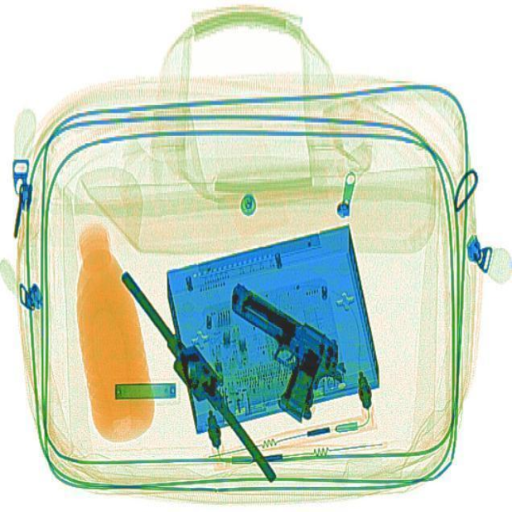
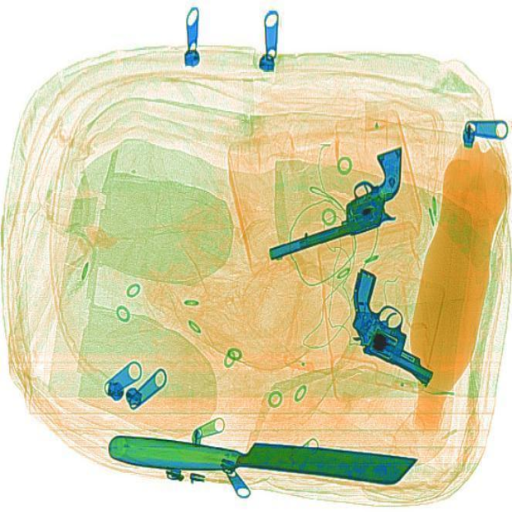
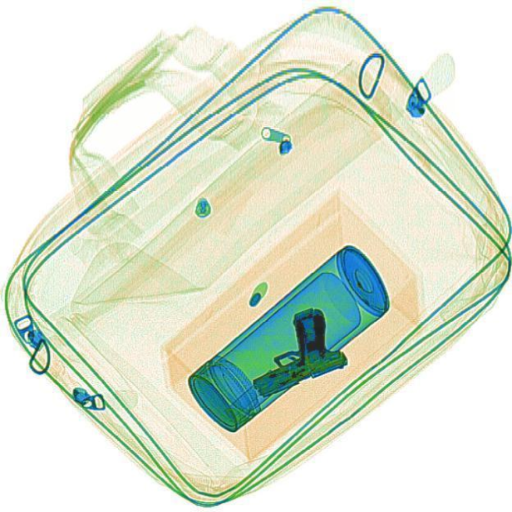
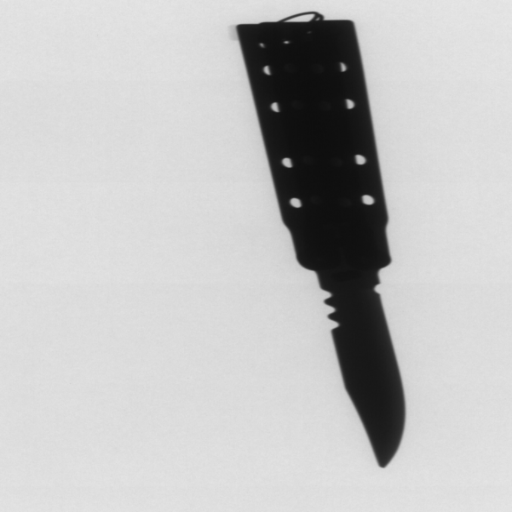
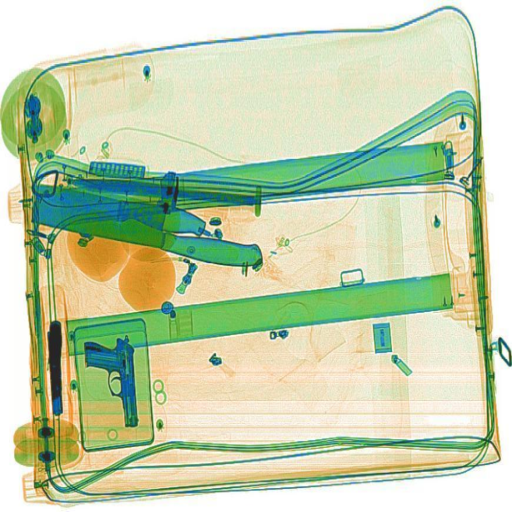
...
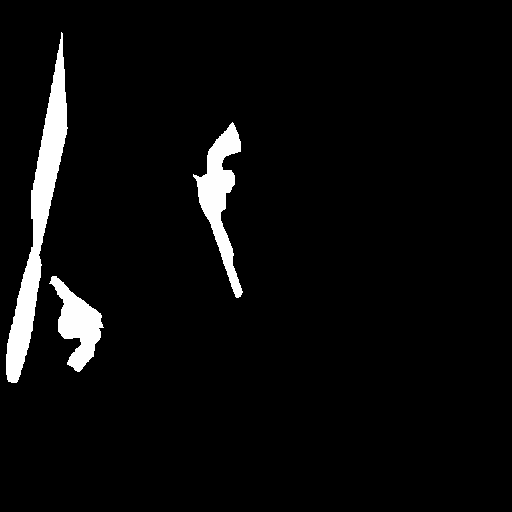
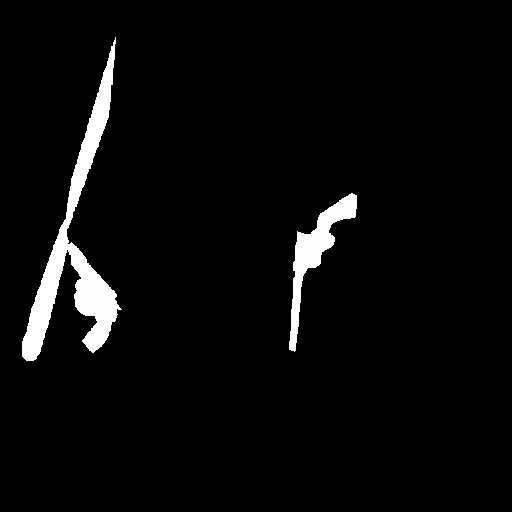
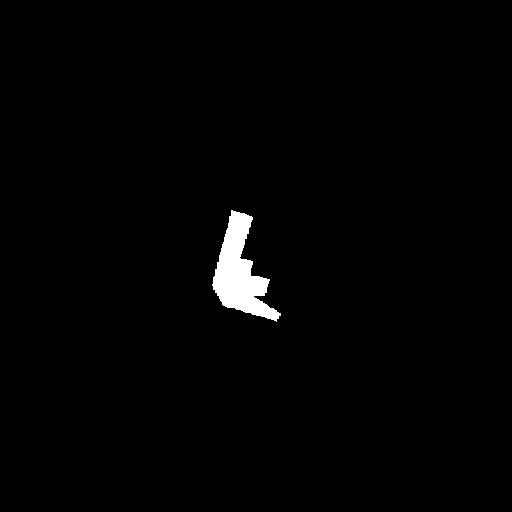
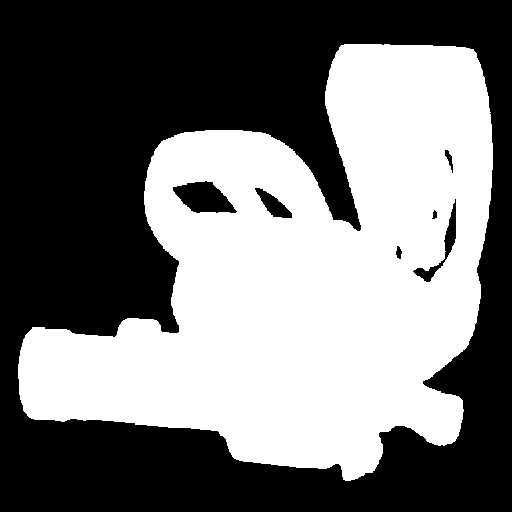
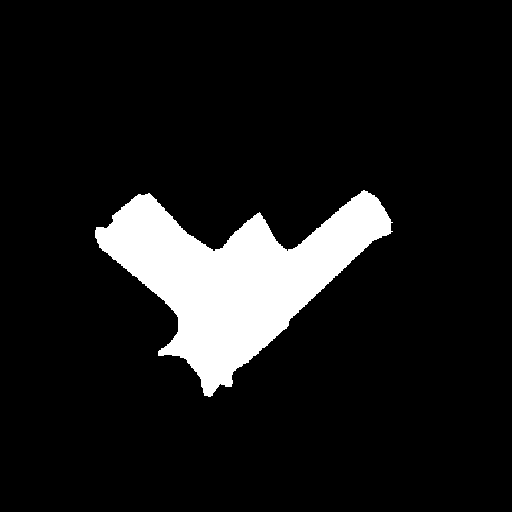

In [8]:
ipyplot.plot_images(training_images[:,:,:,::-1], max_images=10, img_width=150)
ipyplot.plot_images(training_masks*255, max_images=10, img_width=150)


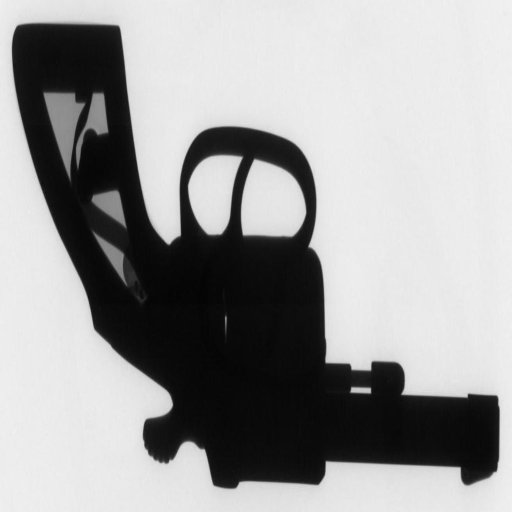
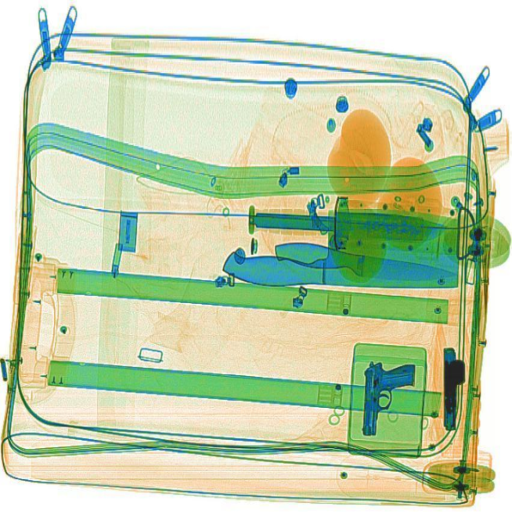
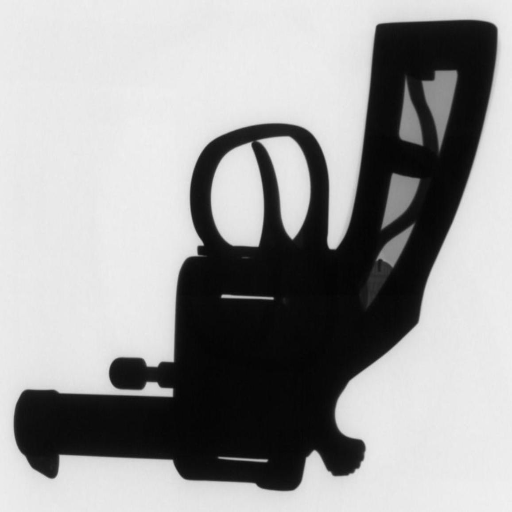
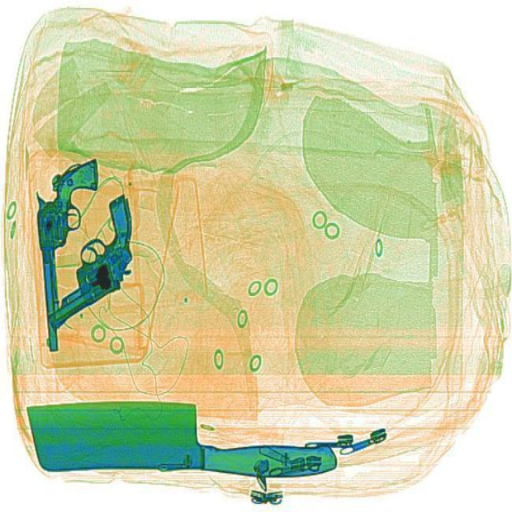
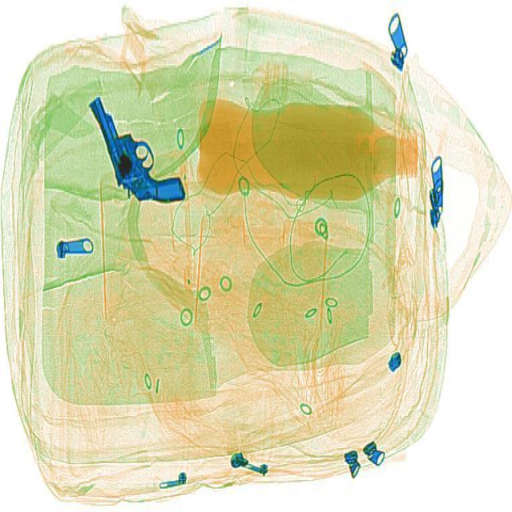
...
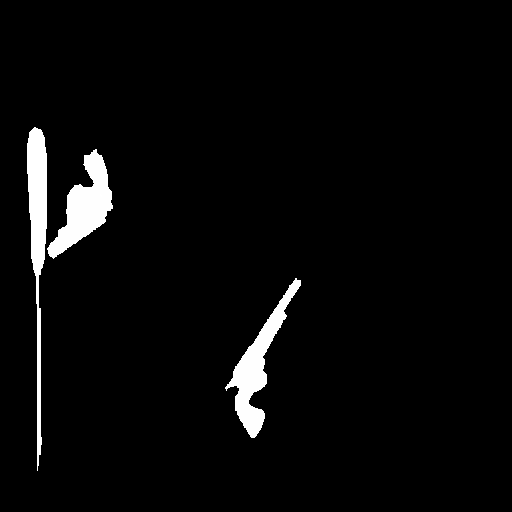
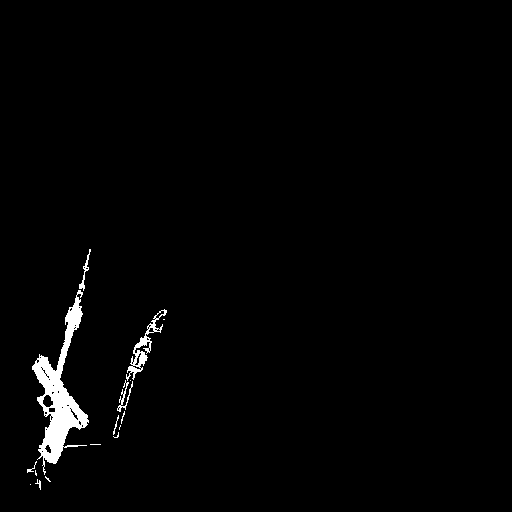
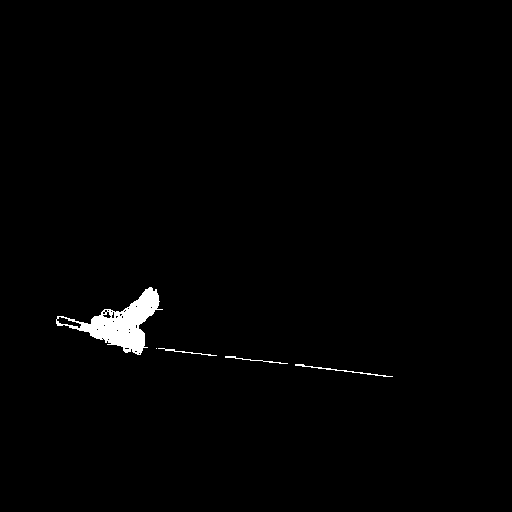
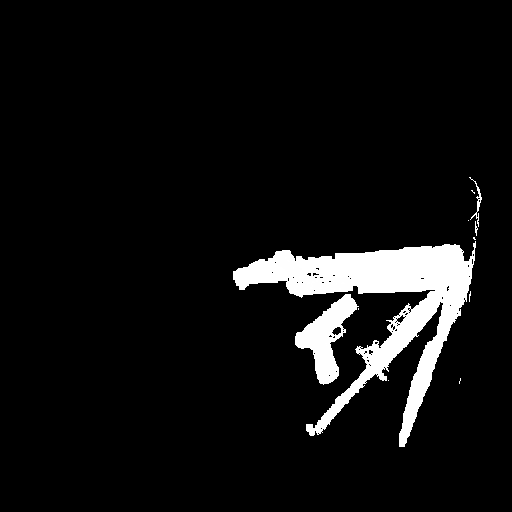
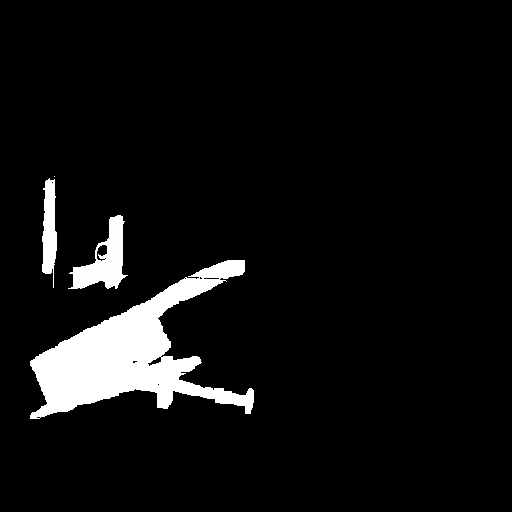

In [9]:
ipyplot.plot_images(testing_images[:,:,:,::-1], max_images=10, img_width=150)
ipyplot.plot_images(testing_masks*255, max_images=10, img_width=150)

# Defining the Architecture

Now we are going to create the LWNet architecture and then we are going to compile it.

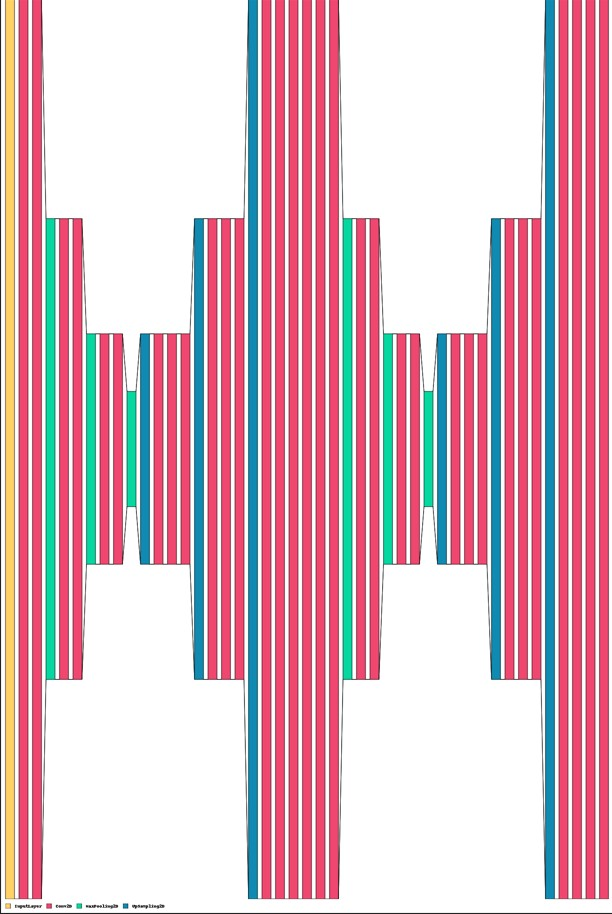

In [10]:
inputs = Input((512,512,3))

#Size = (256,256,8)
conv1 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
conv1 = BatchNormalization()(conv1)
conv1 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
batch1 = BatchNormalization()(conv1)
drop1 = Dropout(0.25)(batch1)
pool1 = MaxPooling2D(pool_size=(2, 2))(drop1)

#Size = (128,128,16)
conv2 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
conv2 = BatchNormalization()(conv2)
conv2 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
batch2 = BatchNormalization()(conv2)
drop2 = Dropout(0.25)(batch2)
pool2 = MaxPooling2D(pool_size=(2, 2))(drop2)

#Size = (64,64,32)
conv3 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
conv3 = BatchNormalization()(conv3)
conv3 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
batch3 = BatchNormalization()(conv3)
drop3 = Dropout(0.25)(batch3)
pool3 = MaxPooling2D(pool_size=(2, 2))(drop3)
###############Downsampling ends here#############################


##############Upsampling starts here##############################
#Size = (128,128,16)
up4 = (UpSampling2D(size=(2, 2))(pool3))
up4 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up4)
up4 = BatchNormalization()(up4)
merge4 = concatenate([drop3, up4], axis=3)
conv4 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge4)
conv4 = BatchNormalization()(conv4)
conv4 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)
conv4 = BatchNormalization()(conv4)

#Size = (256,256,8)
up7 = (UpSampling2D(size=(2, 2))(conv4))
up7 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up7)
up7 = BatchNormalization()(up7)
merge7 = concatenate([drop2, up7], axis=3)
conv7 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
conv7 = BatchNormalization()(conv7)
conv7 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)
conv7 = BatchNormalization()(conv7)

#Size = (512,512,1)
up8 = (UpSampling2D(size=(2, 2))(conv7))
up8 = Conv2D(1, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up8)
up8 = BatchNormalization()(up8)
merge8 = concatenate([drop1, up8], axis=3)
conv8 = Conv2D(1, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge8)
conv8 = BatchNormalization()(conv8)
conv8 = Conv2D(1, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv8)
conv8 = BatchNormalization()(conv8)

conv10 = Conv2D(1, 1, activation='sigmoid')(conv8)
#######################################################################################################################
#######################################################################################################################


attn_map = concatenate([conv10, inputs], axis=3)

#Size = (256,256,8)
conv11 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(attn_map)
conv11 = BatchNormalization()(conv11)
conv11 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv11)
batch11 = BatchNormalization()(conv11)
drop11 = Dropout(0.25)(batch11)
pool11 = MaxPooling2D(pool_size=(2, 2))(drop11)

#Size = (128,128,16)
conv12 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool11)
conv12 = BatchNormalization()(conv12)
conv12 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv12)
batch12 = BatchNormalization()(conv12)
drop12 = Dropout(0.25)(batch12)
pool12 = MaxPooling2D(pool_size=(2, 2))(drop12)

#Size = (64,64,32)
conv13 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool12)
conv13 = BatchNormalization()(conv13)
conv13 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv13)
batch13 = BatchNormalization()(conv13)
drop13 = Dropout(0.25)(batch13)
pool13 = MaxPooling2D(pool_size=(2, 2))(drop13)
###############Downsampling ends here#############################


##############Upsampling starts here##############################
#Size = (128,128,16)
up14 = (UpSampling2D(size=(2, 2))(pool13))
up14 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up14)
up14 = BatchNormalization()(up14)
merge14 = concatenate([drop13, up14], axis=3)
conv14 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge14)
conv14 = BatchNormalization()(conv14)
conv14 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv14)
conv14 = BatchNormalization()(conv14)

#Size = (256,256,8)
up17 = (UpSampling2D(size=(2, 2))(conv14))
up17 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up17)
up17 = BatchNormalization()(up17)
merge17 = concatenate([drop12, up17], axis=3)
conv17 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge17)
conv17 = BatchNormalization()(conv17)
conv17 = Conv2D(8, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv17)
conv17 = BatchNormalization()(conv17)

#Size = (512,512,1)
up18 = (UpSampling2D(size=(2, 2))(conv17))
up18 = Conv2D(1, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up18)
up18 = BatchNormalization()(up18)
merge18 = concatenate([drop11, up18], axis=3)
conv18 = Conv2D(1, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge18)
conv18 = BatchNormalization()(conv18)
conv18 = Conv2D(1, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv18)
conv18 = BatchNormalization()(conv18)

conv20 = Conv2D(1, 1, activation='sigmoid')(conv18)


my_model = Model(inputs=inputs, outputs=[conv10, conv20])

my_model.compile(optimizer=Adam(lr=1e-4), loss=[BinaryCrossentropy(), BinaryCrossentropy()],
                 loss_weights=[0.5,0.5], metrics=['binary_accuracy'])

my_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 512, 512, 8)          224       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 512, 512, 8)          32        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 512, 512, 8)          584       ['batch_normalization[0][0

# Training the Model

Now we are going to train our model using the model.fit() function.

In [13]:
epochs = 50

print('Training...')

my_model_history = my_model.fit(x=training_images, y=training_masks, epochs=epochs, initial_epoch=0)




Training...
Epoch 1/50
6/6 [==============================] - 9s 1s/step - loss: 0.5564 - conv2d_15_loss: 0.5552 - conv2d_31_loss: 0.5577 - conv2d_15_binary_accuracy: 0.9242 - conv2d_31_binary_accuracy: 0.9242
Epoch 2/50
6/6 [==============================] - 9s 1s/step - loss: 0.5519 - conv2d_15_loss: 0.5510 - conv2d_31_loss: 0.5528 - conv2d_15_binary_accuracy: 0.9242 - conv2d_31_binary_accuracy: 0.9242
Epoch 3/50
6/6 [==============================] - 9s 1s/step - loss: 0.5473 - conv2d_15_loss: 0.5470 - conv2d_31_loss: 0.5477 - conv2d_15_binary_accuracy: 0.9242 - conv2d_31_binary_accuracy: 0.9242
Epoch 4/50
6/6 [==============================] - 9s 1s/step - loss: 0.5429 - conv2d_15_loss: 0.5424 - conv2d_31_loss: 0.5434 - conv2d_15_binary_accuracy: 0.9242 - conv2d_31_binary_accuracy: 0.9242
Epoch 5/50
6/6 [==============================] - 9s 1s/step - loss: 0.5389 - conv2d_15_loss: 0.5386 - conv2d_31_loss: 0.5392 - conv2d_15_binary_accuracy: 0.9242 - conv2d_31_binary_accuracy: 0.924

# Gauging the Performance

Now that we have trained our model, we need to figure our how good the model actually is. One of the ways to do that is to use a confusion matrix. Simply, put, the confusion matrix is a representation of how well our model is performing for all the classes and for each class as well.

We need to pass our testing images through the model first in order to obtain the confusion matrix.

In [16]:
# Save the model to a file
my_model.save('my_model.h5')



/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2/2 [==============================] - 0s 274ms/step
(2, 36, 512, 512, 1)
(36, 512, 512, 1)
(36, 512, 512)
(36, 512, 512) (36, 512, 512)



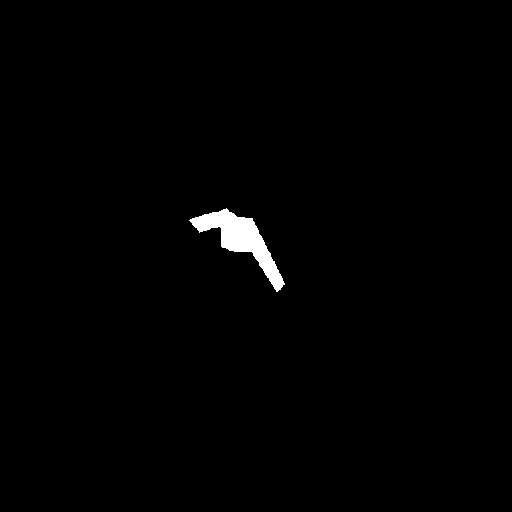
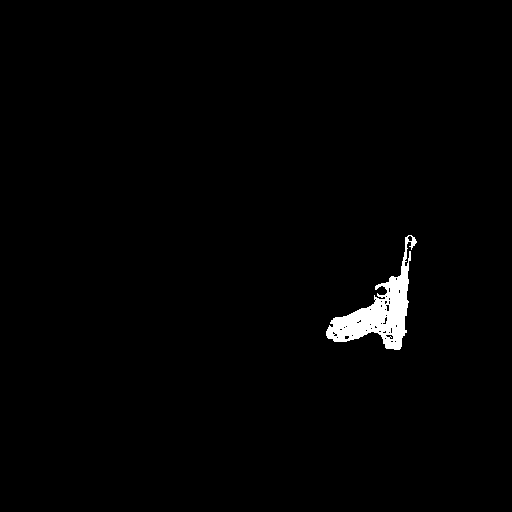
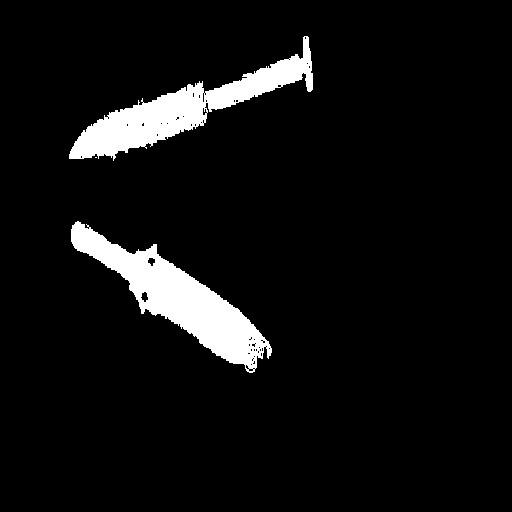
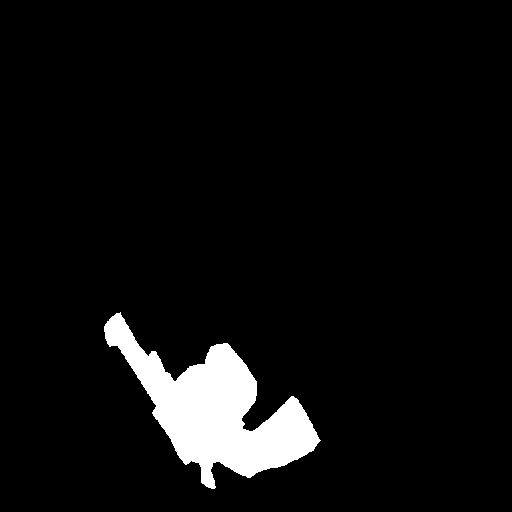
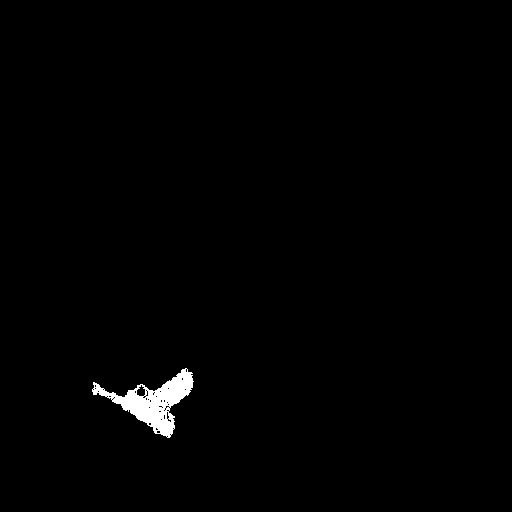
...
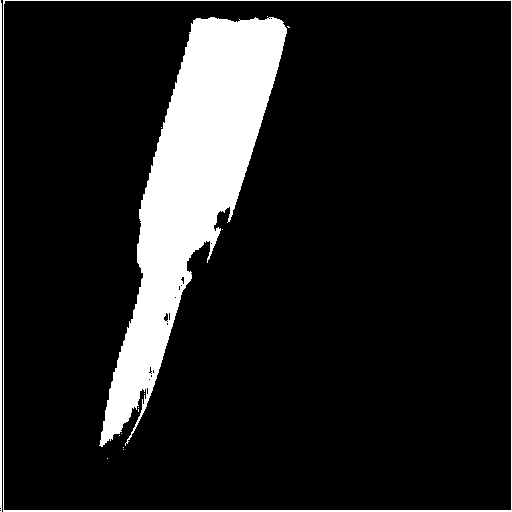
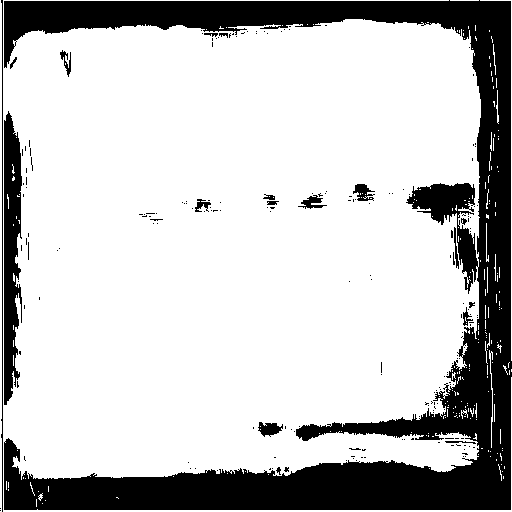
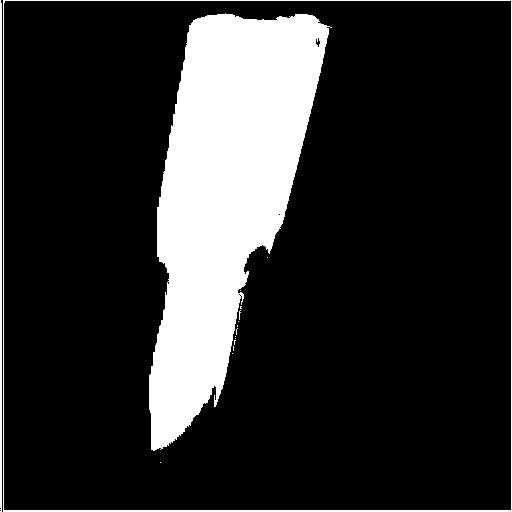
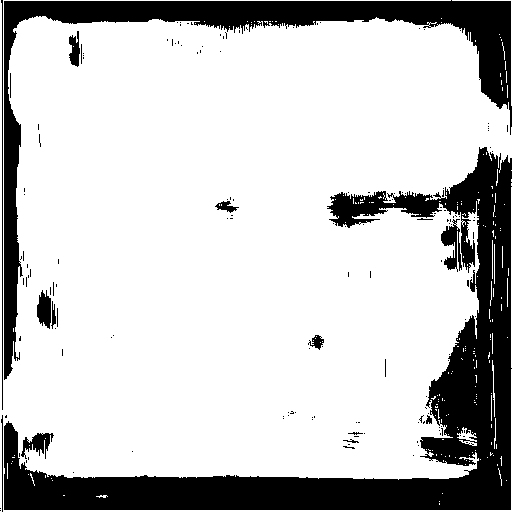
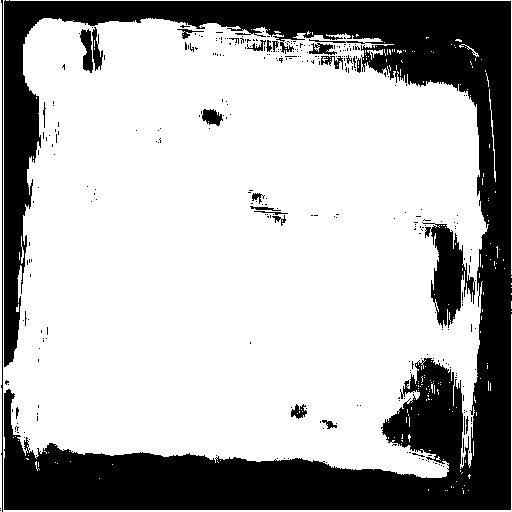

In [20]:


my_predictions = my_model.predict(testing_images)

print(np.shape(my_predictions))

my_predictions = my_predictions[-1]

print(my_predictions.shape)


my_predictions = np.asarray(my_predictions*255).astype(np.uint8).reshape(36,512,512)
print(my_predictions.shape)


for i in range(len(my_predictions)):
  my_predictions[i,...] = cv2.threshold(my_predictions[i,...].reshape(512,512), 0, 1, cv2.THRESH_OTSU)[1]



ground_truths_masks = np.asarray(testing_masks, dtype=np.uint8)
my_predictions = np.asarray(my_predictions, dtype=np.uint8)

print(np.shape(ground_truths_masks), np.shape(my_predictions))

ipyplot.plot_images(testing_masks*255, max_images=10, img_width=150)
ipyplot.plot_images(my_predictions*255, max_images=10, img_width=150)


In [19]:
# Reshape predictions and ground truths appropriately
my_predictions_flat = my_predictions.flatten().reshape(-1, 1)
ground_truths_masks_flat = ground_truths_masks.flatten().reshape(-1, 1)

# Change 'average' to an appropriate value
validation_accuracy = f1_score(ground_truths_masks_flat, my_predictions_flat, average='micro')

print('F1 score: ', validation_accuracy)

F1 score:  0.5077856911553277
